### Background : 
As a Senior Business Analyst as IBM, I was informed that the latest company report was released and the employee retention rate has dropped to 84%.

My job is to discover what the key drivers are for employees churning and predict IBM employees at risk of churning. My team has already suggested that a Decision Tree or Gaussian NB machine model is best for prediction, but my job is to fit another classifier and compare it to the ones my team drafted and use exploratory data analysis, visualizations and accuracy scores to make recommendations for IBM to increase employee retention and choose the best performing model.

### Objective : 

* To identify which are the different factors that drive attrition?
* Make a model to predict the attrition? Which algorithm gives the best performance?


### Dataset :
The data contains demographic details, work-related metrics and attrition flag.

* EmployeeNumber - Employee Identifier
* Attrition - Did the employee attrite?
* Age - Age of the employee
* BusinessTravel - Travel commitments for the job
* DailyRate - Data description not available**
* Department - Employee Department
* DistanceFromHome - Distance from work to home (in km)
* Education - 1-Below College, 2-College, 3-Bachelor, 4-Master,5-Doctor
* EducationField - Field of Education
* EmployeeCount - Employee Count in a row
* EnvironmentSatisfaction - 1-Low, 2-Medium, 3-High, 4-Very High
* Gender - Employee's gender
* HourlyRate - Data description not available**
* JobInvolvement - 1-Low, 2-Medium, 3-High, 4-Very High
* JobLevel - Level of job (1 to 5)
* JobRole - Job Roles
* JobSatisfaction - 1-Low, 2-Medium, 3-High, 4-Very High
* MaritalStatus - Marital Status
* MonthlyIncome - Monthly Salary
* MonthlyRate - Data description not available**
* NumCompaniesWorked - Number of companies worked at
* Over18 - Over 18 years of age?
* OverTime - Overtime?
* PercentSalaryHike - The percentage increase in salary last year
* PerformanceRating - 1-Low, 2-Good, 3-Excellent, 4-Outstanding
* RelationshipSatisfaction - 1-Low, 2-Medium, 3-High, 4-Very High
* StandardHours - Standard Hours
* StockOptionLevel - Stock Option Level
* TotalWorkingYears - Total years worked
* TrainingTimesLastYear - Number of training attended last year
* WorkLifeBalance - 1-Low, 2-Good, 3-Excellent, 4-Outstanding
* YearsAtCompany - Years at Company
* YearsInCurrentRole - Years in the current role
* YearsSinceLastPromotion - Years since the last promotion
* YearsWithCurrManager - Years with the current manager

** **In the real world, you will not find definitions for some of your variables. It is a part of the analysis to figure out what they might mean.**

### Import necessary libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
import scipy.stats as stats
from sklearn import metrics
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
import warnings
warnings.filterwarnings('ignore')

C:\Users\hoang\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### Note: The first section of the notebook is the section that has been covered multiple times in the previous case studies.  For this discussion this part can be skipped and we can directly refer to this **<a href = #link1>summary</a>** of observations from EDA.

### Read the dataset

In [2]:
hr=pd.read_csv("WA_Fn-UseC_-HR-Employee-Attrition.csv")

In [3]:
# copying data to another varaible to avoid any changes to original data
data=hr.copy()

### View the first and last 5 rows of the dataset.

In [4]:
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [5]:
data.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


### Understand the shape of the dataset.

In [6]:
data.shape

(1470, 35)

* The dataset has 1470 rows and 35 columns of data

### Check the data types of the columns for the dataset.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

**Observations -**
* There are no null values in the dataset.
* We can convert the object type columns to categories.

`converting "objects" to "category" reduces the data space required to store the dataframe`

### Fixing the data types

In [8]:
cols = data.select_dtypes(['object'])
cols.columns

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object')

In [9]:
for i in cols.columns:
    data[i] = data[i].astype('category')

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Age                       1470 non-null   int64   
 1   Attrition                 1470 non-null   category
 2   BusinessTravel            1470 non-null   category
 3   DailyRate                 1470 non-null   int64   
 4   Department                1470 non-null   category
 5   DistanceFromHome          1470 non-null   int64   
 6   Education                 1470 non-null   int64   
 7   EducationField            1470 non-null   category
 8   EmployeeCount             1470 non-null   int64   
 9   EmployeeNumber            1470 non-null   int64   
 10  EnvironmentSatisfaction   1470 non-null   int64   
 11  Gender                    1470 non-null   category
 12  HourlyRate                1470 non-null   int64   
 13  JobInvolvement            1470 non-null   int64 

`we can see that the memory usage has decreased from 804 KB to 624.4 KB`, this technique is generally useful for bigger datasets.

### Summary of the dataset.

In [11]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


* EmployeeNumber is an ID variable and not useful for predictive modelling.
* Age of the employees range from 18 to 60 years and the average age is 36 years.
* EmployeeCount has only 1 as the value in all the rows and can be dropped as it will not be adding any information to our analysis.
* Standard Hours has only 80 as the value in all the rows and can be dropped as it will not be adding any information to our analysis.
* Hourly rate has a huge range, but we do not know what this variable stands for, yet. The same goes for daily and monthly rates.
* Monthly Income has a high range and the difference in mean and median indicate the presence of outliers.

In [12]:
data.describe(include=['category']).T

,count,unique,top,freq
Attrition,1470,2,No,1233
BusinessTravel,1470,3,Travel_Rarely,1043
Department,1470,3,Research & Development,961
EducationField,1470,6,Life Sciences,606
Gender,1470,2,Male,882
JobRole,1470,9,Sales Executive,326
MaritalStatus,1470,3,Married,673
Over18,1470,1,Y,1470
OverTime,1470,2,No,1054


* Attrition is our target variable with 84% records 'No' or employee will not attrite.
* Majority of the employees have low business travel requirements
* Majority of the employees are from the Research and Development department.
* All employees are over 18 years of age -  we can drop this variable as it will not be adding any information to our analysis.
* There are more male employees than female employees.

**Dropping columns which are not adding any information.**

In [13]:
data.drop(['EmployeeNumber','EmployeeCount','StandardHours','Over18'],axis=1,inplace=True)

**Let's look at the unqiue values of all the categories**

In [14]:
cols_cat= data.select_dtypes(['category'])

In [15]:
for i in cols_cat.columns:
    print('Unique values in',i, 'are :')
    print(cols_cat[i].value_counts())
    print('*'*50)

Unique values in Attrition are :
No     1233
Yes     237
Name: Attrition, dtype: int64
**************************************************
Unique values in BusinessTravel are :
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64
**************************************************
Unique values in Department are :
Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64
**************************************************
Unique values in EducationField are :
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64
**************************************************
Unique values in Gender are :
Male      882
Female    588
Name: Gender, dtype: int64
**************************************************
Unique values in JobRole are :
Sales Executive    

### EDA

### Univariate analysis

In [16]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

### Observations on Age

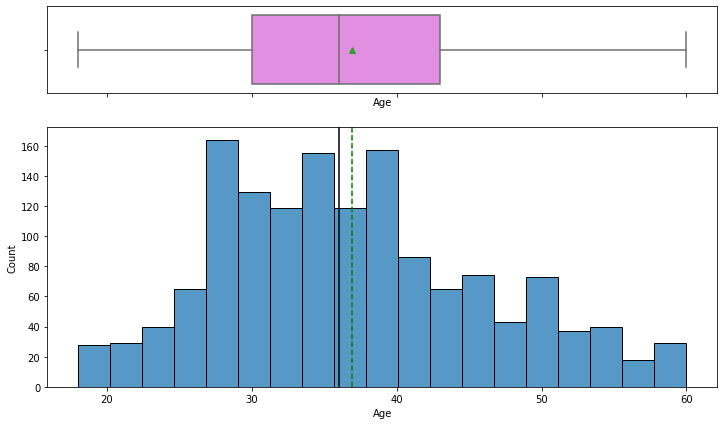

In [17]:
histogram_boxplot(data,'Age')

* Age is looking normally distributed, with a hint of right skew.

### Observations on DailyRate

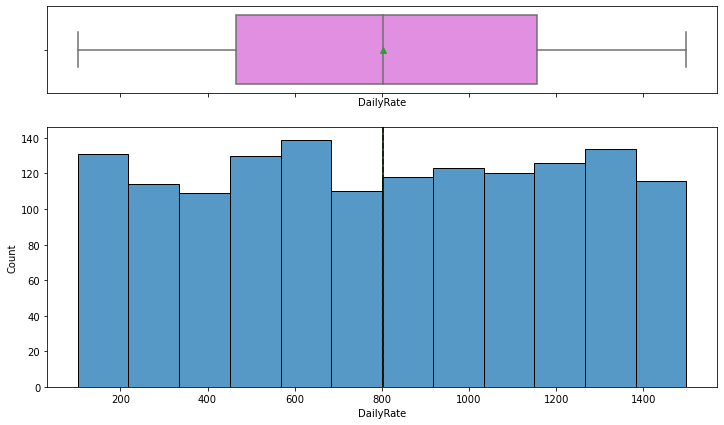

In [18]:
histogram_boxplot(data,'DailyRate')

* The daily rate has a fairly uniform distribution with a mean and median at 800.

### Observations on DistanceFromHome

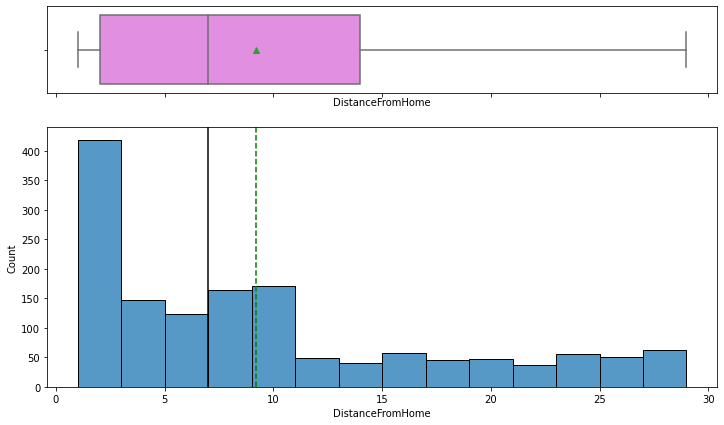

In [19]:
histogram_boxplot(data,'DistanceFromHome')

* This is a right-skewed distribution.
* Most people live close to work but we do have some employees that live at a distance.

### Observations on HourlyRate

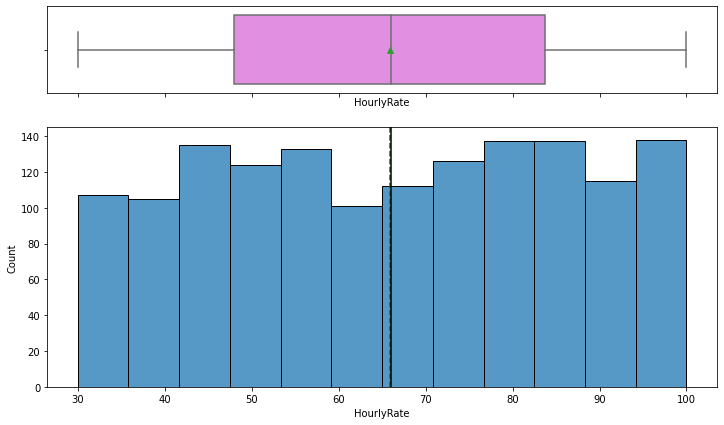

In [20]:
histogram_boxplot(data,'HourlyRate')

* Quite inline with the daily rate, the hourly rate is also fairly uniformly distributed with mean and median at 65.

### Observations on MonthlyIncome

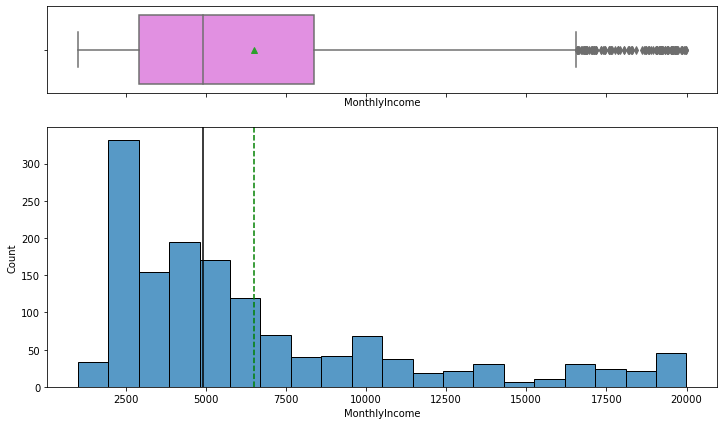

In [21]:
histogram_boxplot(data,'MonthlyIncome')

* Income distribution across a unit is almost always right-skewed and similar is the case here.
* As expected, from the boxplot we can see that there are a few outliers who earn much higher than the rest of the employees.

### Observations on MonthlyRate

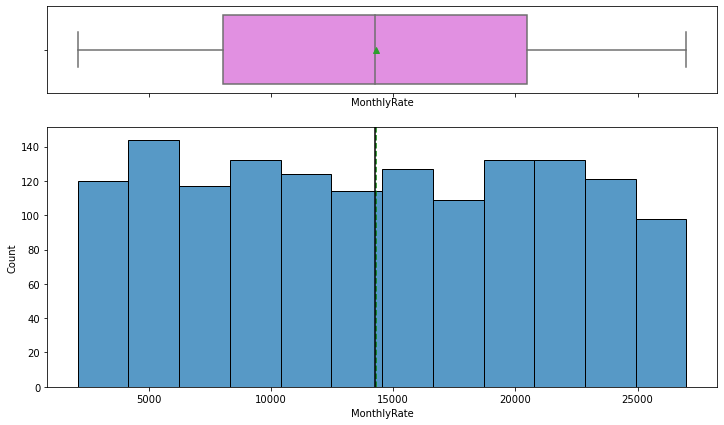

In [22]:
histogram_boxplot(data,'MonthlyRate')

* Monthly rate also has a uniform distribution with mean and median close to 14500.

### Observations on NumCompaniesWorked

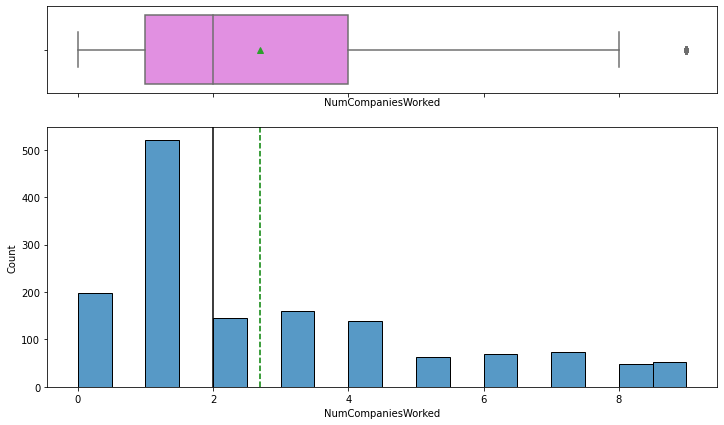

In [23]:
histogram_boxplot(data,'NumCompaniesWorked')

* On average, people have worked at 2.5 companies. Median is 2.
* Most people have worked at only 1 company.
* Nearly 350 employees have worked at 0 companies, clearly this means this variable indicates the number of companies worked at before joining ours.
* There is an outlier employee who has changed 9 companies.

### Observations on PercentSalaryHike

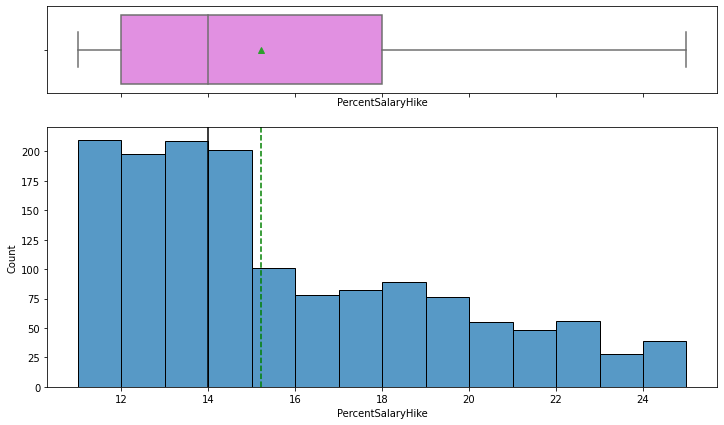

In [24]:
histogram_boxplot(data,'PercentSalaryHike')

* Salary hike is Right skewed. We shall check later if the hike percentage is a function of performance rating or job level. 
* Mean percentage salary hike is 15%.

### Observations on TotalWorkingYears

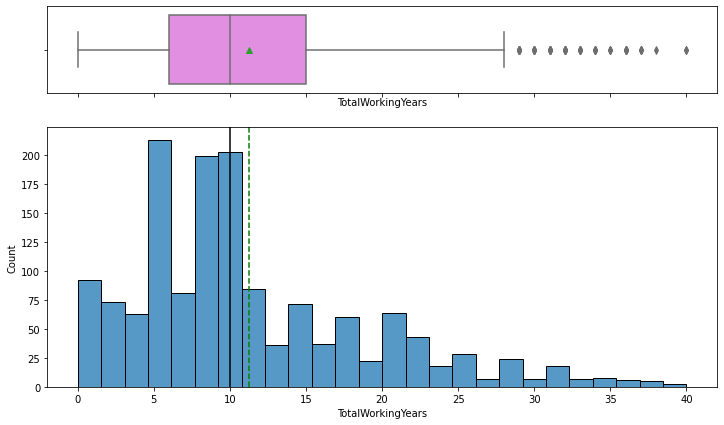

In [25]:
histogram_boxplot(data,'TotalWorkingYears')

* Age of the employees had a hint of right skew but work experience has a significant right skew.
* From the boxplot, we can observe that this variable contains a few outliers also.

### Observations on YearsAtCompany

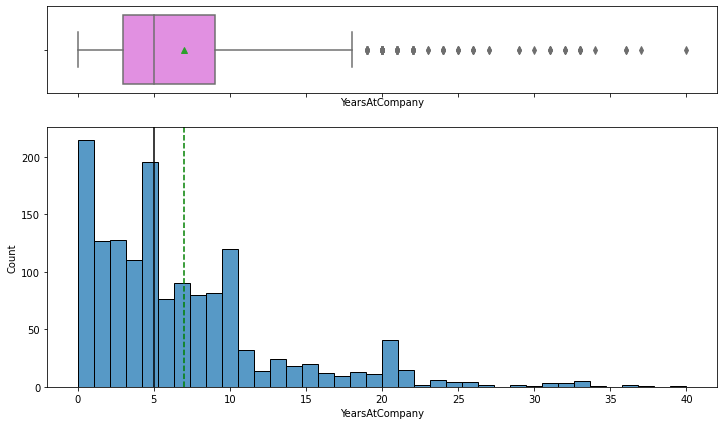

In [26]:
histogram_boxplot(data,'YearsAtCompany')

* Significant right skew in the data.
* The outliers are probably the most loyal employees and it suggests that they would be less likely to attrite.

### Observations on YearsInCurrentRole

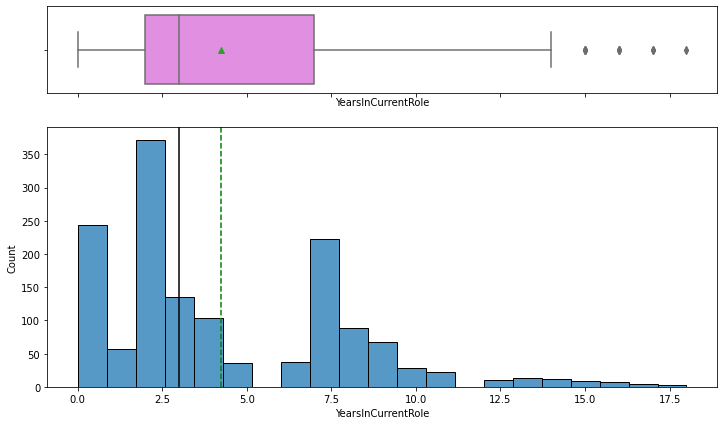

In [27]:
histogram_boxplot(data,'YearsInCurrentRole')

* This distribution has three peaks at 0, 2, and 7.
* There are a few outliers that have stayed in the same role for more than 15 years.

### Observations on YearsInCurrentRole

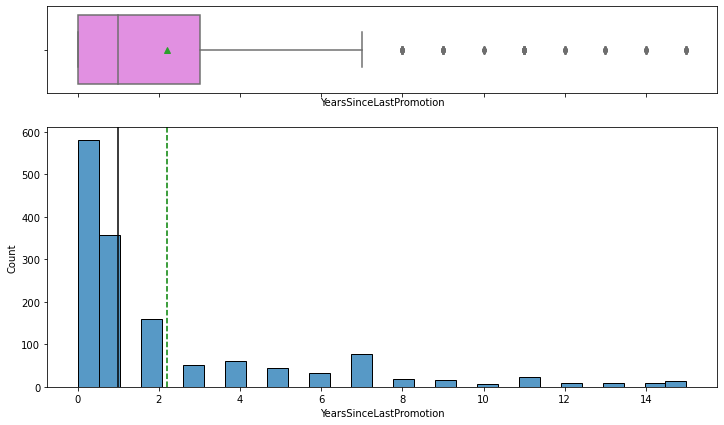

In [28]:
histogram_boxplot(data,'YearsSinceLastPromotion')

* There are a few outliers in this right-skewed distribution, these are probably the people at the highest positions.
* Most employees have had a promotion in the last 2 years. 
* 0 years since last promotion indicates many employees were recently promoted.

### Observations on YearsWithCurrManager

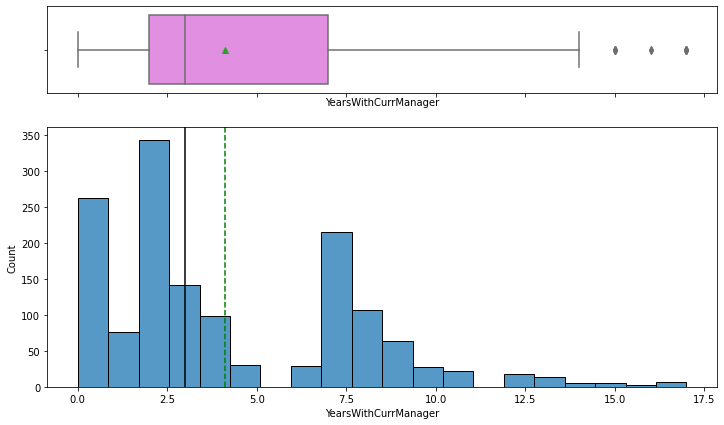

In [29]:
histogram_boxplot(data,'YearsWithCurrManager')

* This distribution is very similar to that of 'Years in current role' and that makes sense.
* There are a few outliers in this variable. 

In [30]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

### Observations on BusinessTravel

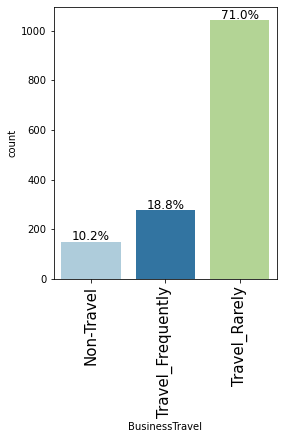

In [31]:
labeled_barplot(data, "BusinessTravel", perc=True)

* 71% of the employees have travel rarely and 18.8% employees have to travel frequently.

### Observations on Department

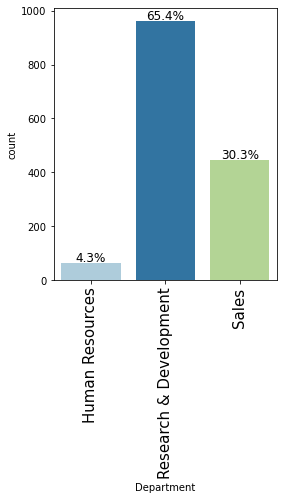

In [32]:
labeled_barplot(data, "Department", perc=True)

* 65.4% of employees in data are from R&D department followed by 30.3% in sales.

### Observations on EducationField

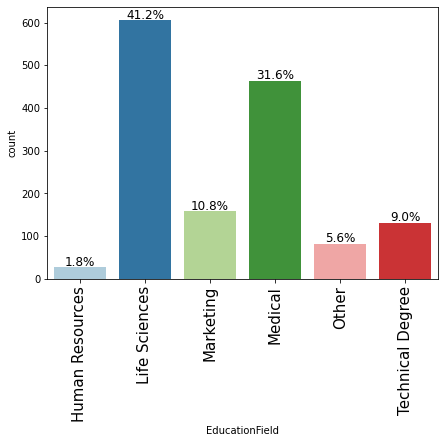

In [33]:
labeled_barplot(data, "EducationField", perc=True)

* 41.2% of the employees are from a Life Sciences background followed by 31.6% from a medical background.

### Observations on Gender

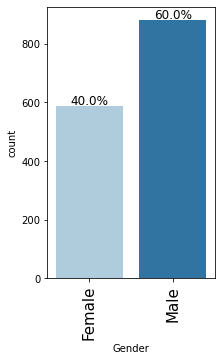

In [34]:
labeled_barplot(data, "Gender", perc=True)

* 60% of male employees and 40% of female employees.

### Observations on JobRole

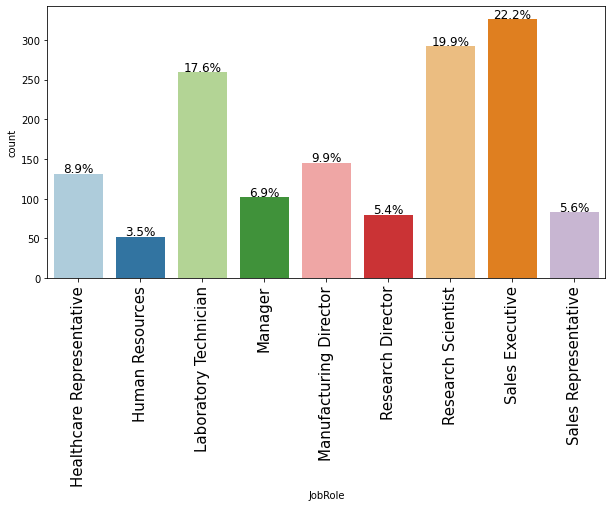

In [35]:
labeled_barplot(data, "JobRole", perc=True)

* 22.2% of employees are Sales Executives followed by 20% of Research Scientists.

### Observations on MaritalStatus

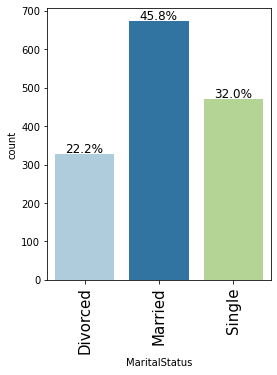

In [36]:
labeled_barplot(data, "MaritalStatus", perc=True)

* 45.8% of the employees are married followed by 32% singles.

### Observations on OverTime

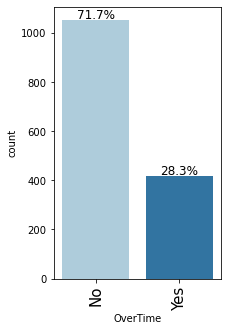

In [37]:
labeled_barplot(data, "OverTime", perc=True)

* 71.7% of the employees are not ready to work over time.

### Observations on Attrition

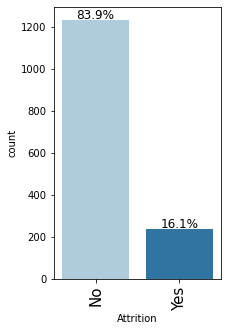

In [38]:
labeled_barplot(data, "Attrition", perc=True)

* 16% of the data points represent the employees who are going to attrite.

## Bivariate Analysis

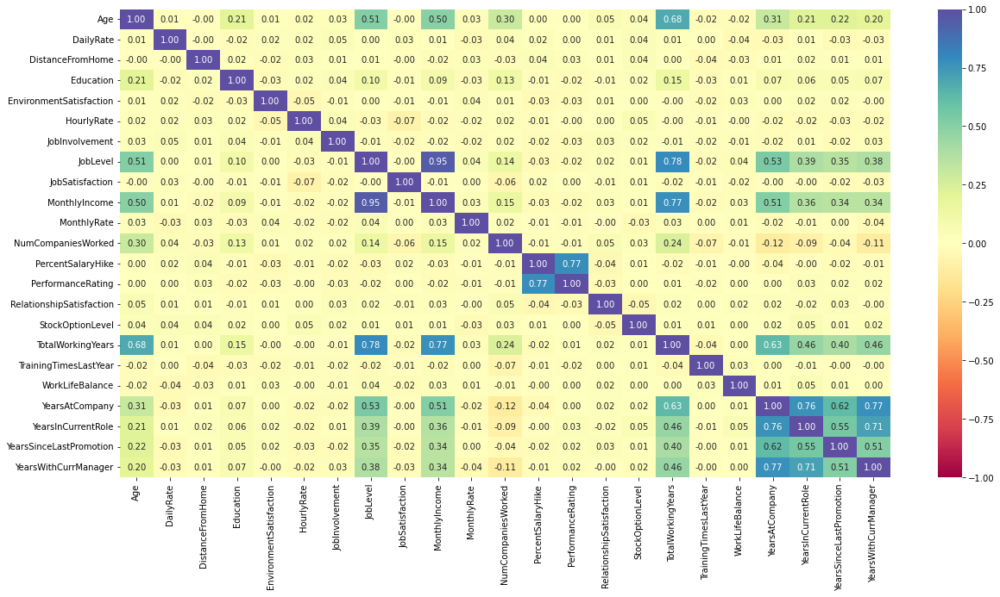

In [39]:
plt.figure(figsize=(20,10))
sns.heatmap(data.corr(),annot=True,vmin=-1,vmax=1,fmt='.2f',cmap="Spectral")
plt.show()

* There are a few variables that are correlated with each other but there are no surprises here.
* Unsurprisingly, TotalWorkingYears is highly correlated to Job Level (i.e., the longer you work the higher job level you achieve).
* HourlyRate, DailyRate, and MonthlyRate are completely uncorrelated with each other which makes it harder to understand what these variables might represent. 
* MonthlyIncome is highly correlated to Job Level.
* Age is positively correlated JobLevel and Education (i.e., the older an employee is, the more educated and at a higher job level they are).
* Work-life Balance is correlated with none of the numeric values.

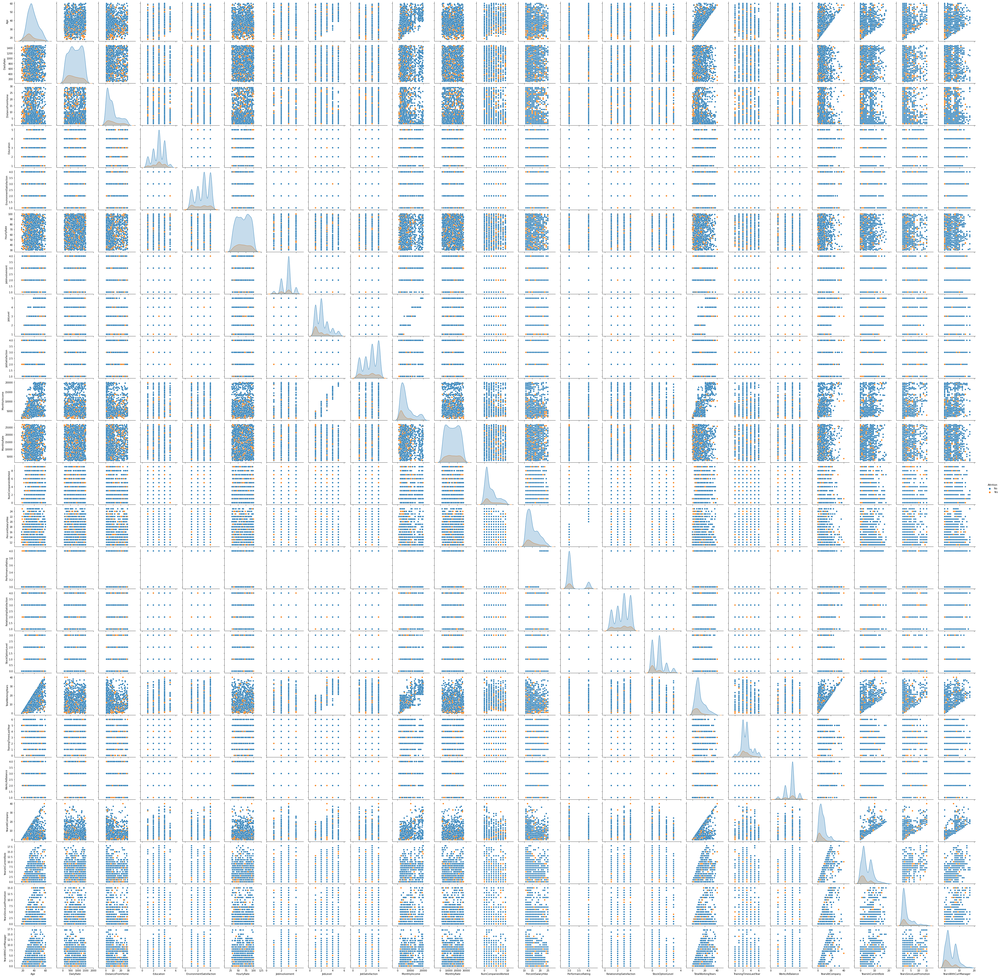

In [40]:
sns.pairplot(data,hue='Attrition')
plt.show()

* We can see varying distributions in variables for Attrition, we should investigate it further.

### Attrition vs Earnings of employee

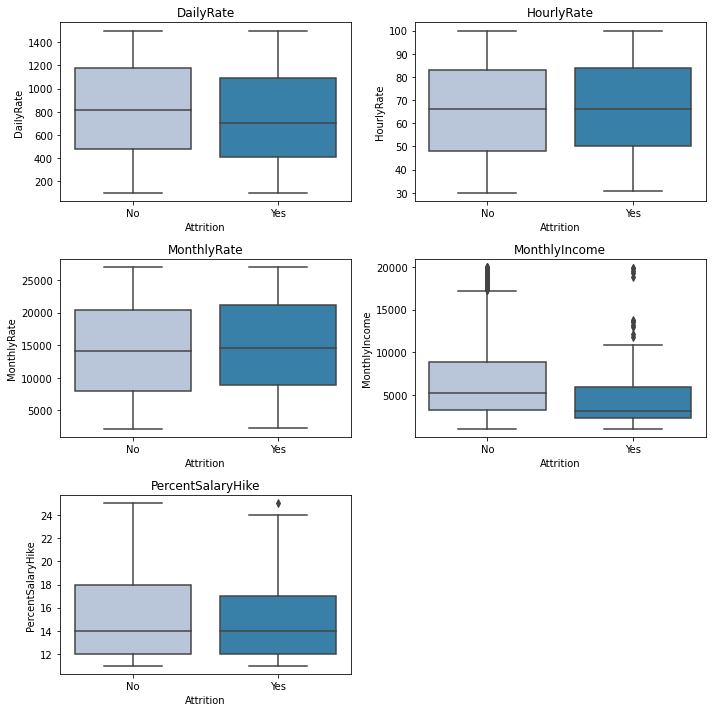

In [41]:
cols = data[['DailyRate','HourlyRate','MonthlyRate','MonthlyIncome','PercentSalaryHike']].columns.tolist()
plt.figure(figsize=(10,10))

for i, variable in enumerate(cols):
                     plt.subplot(3,2,i+1)
                     sns.boxplot(data["Attrition"],data[variable],palette="PuBu")
                     plt.tight_layout()
                     plt.title(variable)
plt.show()

* Employees having lower Daily rate and less monthly wage are more likely to attrite.
* Monthly rate and the hourly rate doesn't seem to have any effect on attrition.
* Lesser salary hike also contributes to attrition.

### Attrition vs Years working in company

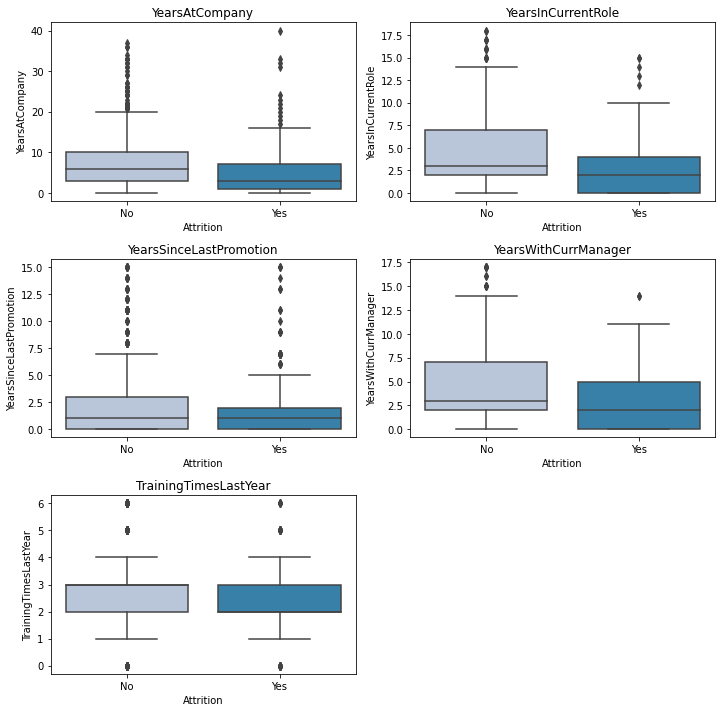

In [42]:
cols = data[['YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager','TrainingTimesLastYear']].columns.tolist()
plt.figure(figsize=(10,10))

for i, variable in enumerate(cols):
                     plt.subplot(3,2,i+1)
                     sns.boxplot(data["Attrition"],data[variable],palette="PuBu")
                     plt.tight_layout()
                     plt.title(variable)
plt.show()

* Those employees who have spent less time at a company, in a current role or with a manager have higher chances of attriting.
* Training doesn't seem to have an impact on Attrition.

### Attrition vs Previous job roles

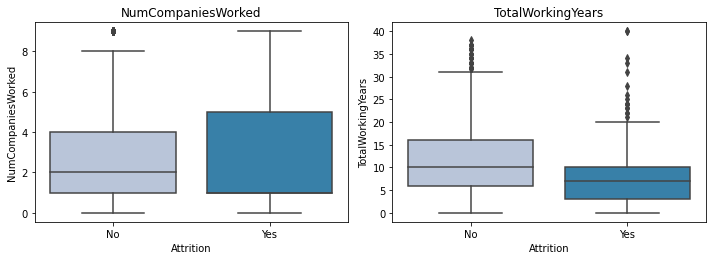

In [43]:
cols = data[['NumCompaniesWorked','TotalWorkingYears']].columns.tolist()
plt.figure(figsize=(10,10))

for i, variable in enumerate(cols):
                     plt.subplot(3,2,i+1)
                     sns.boxplot(data["Attrition"],data[variable],palette="PuBu")
                     plt.tight_layout()
                     plt.title(variable)
plt.show()

* Employees who have worked in more companies generally tend to switch more jobs hence attriting.
* Employees who attrite generally have lesser years of experience.

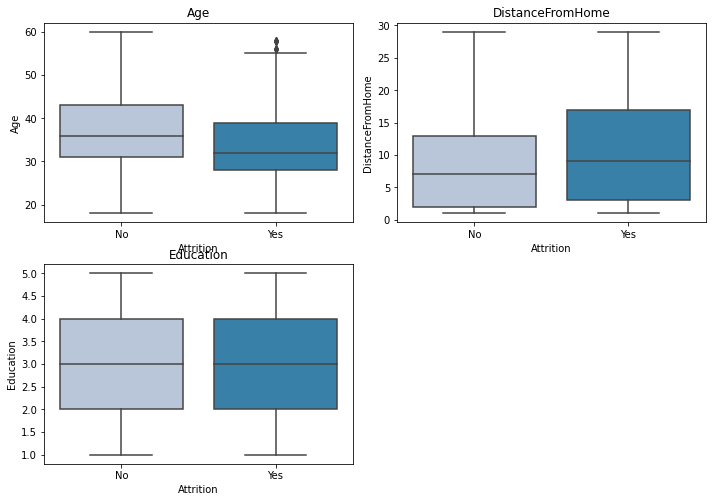

In [44]:
cols = data[['Age','DistanceFromHome','Education']].columns.tolist()
plt.figure(figsize=(10,10))

for i, variable in enumerate(cols):
                     plt.subplot(3,2,i+1)
                     sns.boxplot(data["Attrition"],data[variable],palette="PuBu")
                     plt.tight_layout()
                     plt.title(variable)
plt.show()

* Employees who have to travel a more distance from their home attrite more.
* There is no difference in age and education of attriting and non-attriting employees.

In [45]:
# function to plot stacked bar chart


def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left",
        frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

Attrition            No  Yes   All
BusinessTravel                    
All                1233  237  1470
Travel_Rarely       887  156  1043
Travel_Frequently   208   69   277
Non-Travel          138   12   150
------------------------------------------------------------------------------------------------------------------------


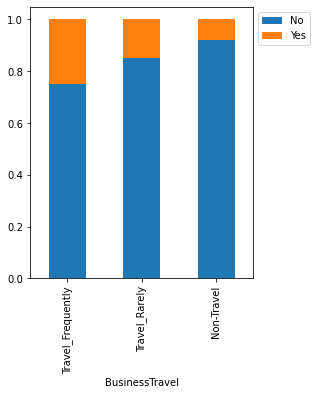

In [46]:
stacked_barplot(data, "BusinessTravel", "Attrition")

* As the travel frequency increases, the Attrition rate increases.
* There's ~22% probability of employees attriting who travel frequently.

Attrition                 No  Yes   All
Department                             
All                     1233  237  1470
Research & Development   828  133   961
Sales                    354   92   446
Human Resources           51   12    63
------------------------------------------------------------------------------------------------------------------------


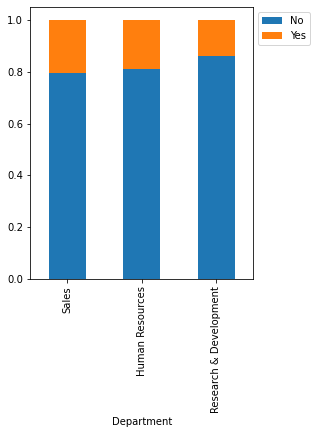

In [47]:
stacked_barplot(data, "Department", "Attrition")

* We saw earlier that majority of the employees work for the R&D department. The probability of attrition is least there.
* Both Sales and HR have similar Attrition probability.

Attrition           No  Yes   All
EducationField                   
All               1233  237  1470
Life Sciences      517   89   606
Medical            401   63   464
Marketing          124   35   159
Technical Degree   100   32   132
Other               71   11    82
Human Resources     20    7    27
------------------------------------------------------------------------------------------------------------------------


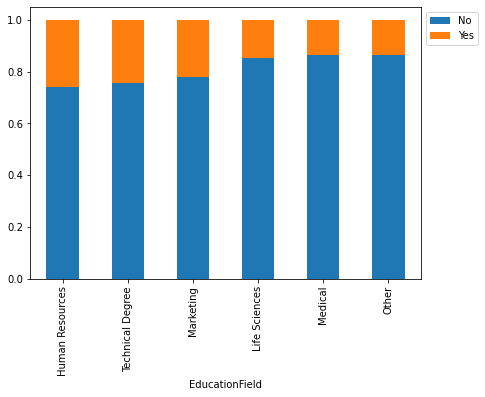

In [48]:
stacked_barplot(data,"EducationField","Attrition")

* 25% of employees educated in human resources attrite.
* Attrition probability is also high in the case of marketing and technical degree holders.

Attrition                  No  Yes   All
EnvironmentSatisfaction                 
All                      1233  237  1470
1                         212   72   284
3                         391   62   453
4                         386   60   446
2                         244   43   287
------------------------------------------------------------------------------------------------------------------------


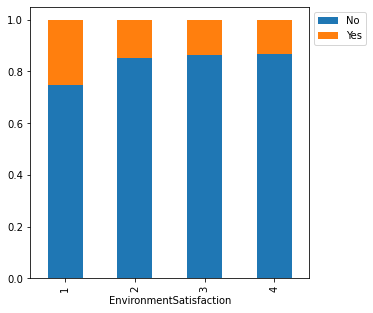

In [49]:
stacked_barplot(data,"EnvironmentSatisfaction","Attrition")

* Employees who say they have low satisfaction with their work environments are likely to attrite.
* There's a ~40% probability of attrition among employees with low ratings for environment satisfaction.

Attrition         No  Yes   All
JobInvolvement                 
All             1233  237  1470
3                743  125   868
2                304   71   375
1                 55   28    83
4                131   13   144
------------------------------------------------------------------------------------------------------------------------


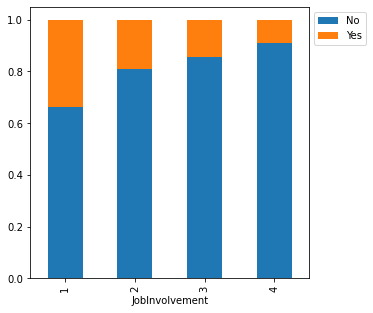

In [50]:
stacked_barplot(data,"JobInvolvement","Attrition")

* Job Involvement looks like a very strong indicator of attrition.
* Higher the job involvement, greater is the chance that the employee will stay with us and not attrite.
* Employees unhappy with their job involment have ~55% probability of attriting (those who rated 0 and 1).
* Further investigation to understand how this variable was collected will give more insights.

Attrition    No  Yes   All
JobLevel                  
All        1233  237  1470
1           400  143   543
2           482   52   534
3           186   32   218
4           101    5   106
5            64    5    69
------------------------------------------------------------------------------------------------------------------------


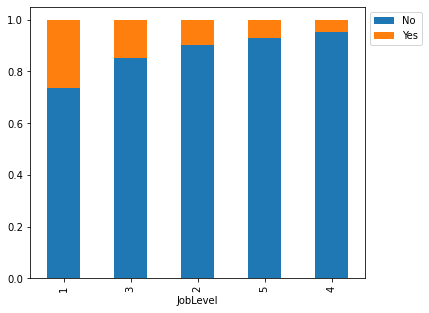

In [51]:
stacked_barplot(data,"JobLevel","Attrition")

* The trend is not very clear here, but it is visible that people at lower job levels are more likely to attrite.

Attrition                    No  Yes   All
JobRole                                   
All                        1233  237  1470
Laboratory Technician       197   62   259
Sales Executive             269   57   326
Research Scientist          245   47   292
Sales Representative         50   33    83
Human Resources              40   12    52
Manufacturing Director      135   10   145
Healthcare Representative   122    9   131
Manager                      97    5   102
Research Director            78    2    80
------------------------------------------------------------------------------------------------------------------------


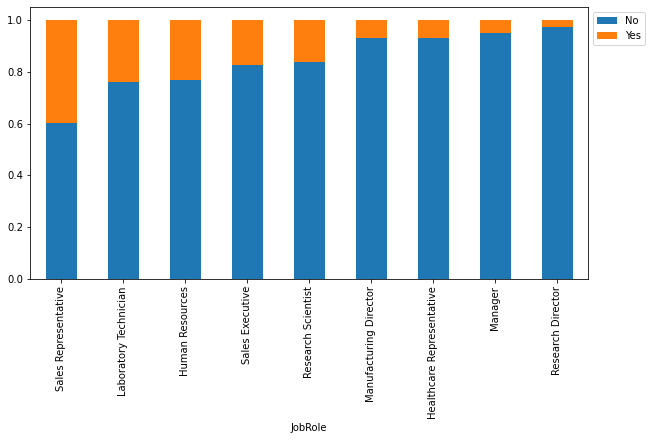

In [52]:
stacked_barplot(data,"JobRole","Attrition")

* Sales Executives have an attrition probability of >40%.
* Laboratory Technicians and Human Resource personnel also have high probabilities of attrition.
* Attrition probability among Research Directors, Manufacturing directors Healthcare representatives, and Managers is much lower than the average attrition probability of 16%.

Attrition          No  Yes   All
JobSatisfaction                 
All              1233  237  1470
3                 369   73   442
1                 223   66   289
4                 407   52   459
2                 234   46   280
------------------------------------------------------------------------------------------------------------------------


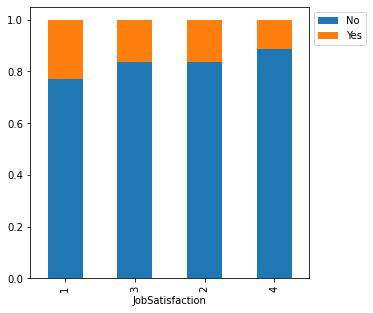

In [53]:
stacked_barplot(data,"JobSatisfaction","Attrition")

* As Job satisfaction increases, attrition probability decreases. This is intuitive but the attrition probability of people who rate 2 and 3 being almost the same is peculiar.  

Attrition        No  Yes   All
MaritalStatus                 
All            1233  237  1470
Single          350  120   470
Married         589   84   673
Divorced        294   33   327
------------------------------------------------------------------------------------------------------------------------


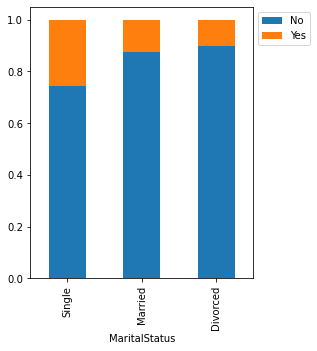

In [54]:
stacked_barplot(data,"MaritalStatus","Attrition")

* Singles attrite more than married and divorced employees.
* One of the reasons here can be that single employees are younger and tend to explore different jobs.

Attrition    No  Yes   All
OverTime                  
All        1233  237  1470
Yes         289  127   416
No          944  110  1054
------------------------------------------------------------------------------------------------------------------------


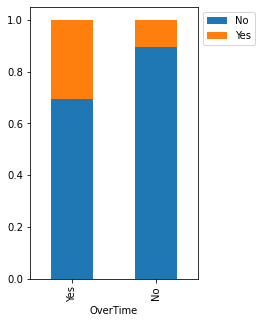

In [55]:
stacked_barplot(data,"OverTime","Attrition")

* Employees who work overtime tend to attrite more.
* There a ~35% probability of attrition among employees working overtime.

Attrition                   No  Yes   All
RelationshipSatisfaction                 
All                       1233  237  1470
3                          388   71   459
4                          368   64   432
1                          219   57   276
2                          258   45   303
------------------------------------------------------------------------------------------------------------------------


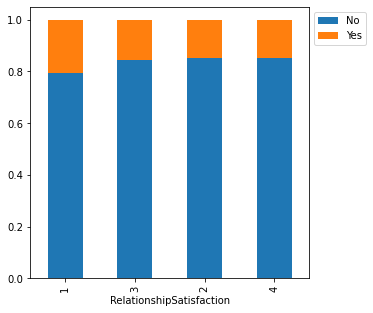

In [56]:
stacked_barplot(data,"RelationshipSatisfaction","Attrition")

* Low relationship satisfaction rating does indicate more probability of attrition, but we need to investigate further which relationships do this variable indicate.

Attrition           No  Yes   All
StockOptionLevel                 
All               1233  237  1470
0                  477  154   631
1                  540   56   596
3                   70   15    85
2                  146   12   158
------------------------------------------------------------------------------------------------------------------------


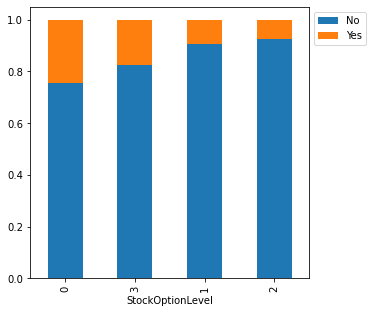

In [57]:
stacked_barplot(data,"StockOptionLevel","Attrition")

* ~22% Employees with highest and lowest stock options attrite the more than others.
* Company should investigate more on why employees with highest stock options are attriting and take this as an opportunity to re-consider their stocks policy.

Attrition          No  Yes   All
WorkLifeBalance                 
All              1233  237  1470
3                 766  127   893
2                 286   58   344
4                 126   27   153
1                  55   25    80
------------------------------------------------------------------------------------------------------------------------


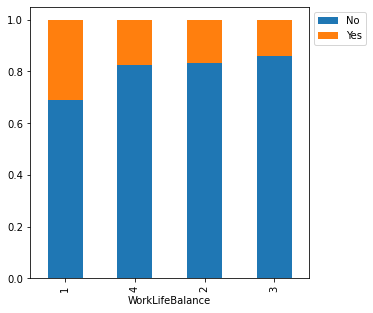

In [58]:
stacked_barplot(data,"WorkLifeBalance","Attrition")

* Low work-life balance rating leads people to attrite, this is a good factor to preempt at attrition risk employees.

**Checking if performace rating and salary hike are related-**

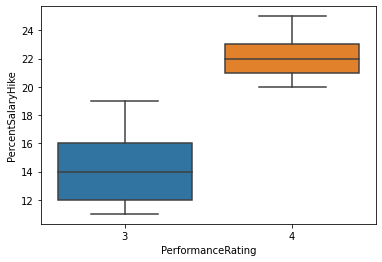

In [59]:
sns.boxplot(data['PerformanceRating'],data['PercentSalaryHike'])
plt.show()

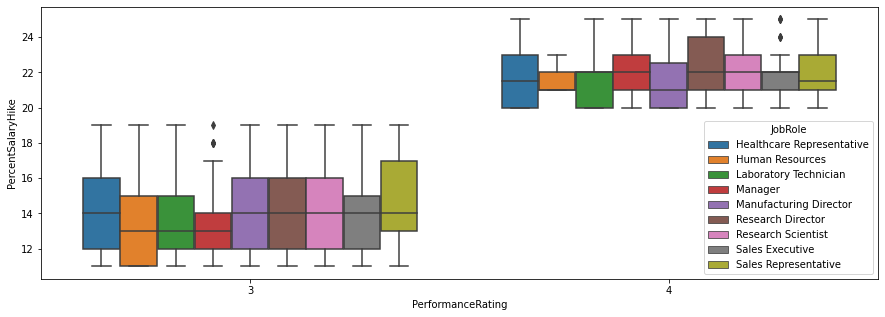

In [60]:
plt.figure(figsize=(15,5))
sns.boxplot(data['PerformanceRating'],data['PercentSalaryHike'],hue=data['JobRole'])
plt.show()

**Observations-**
* Salary hikes are a function of Performance ratings.
* We have to investigate why the employees who get Excellent(3) and Outstanding(4) Performance rating attrite and how then can they be retained.

### <a id='link1'>Summary of EDA</a>
**Data Description:**

* The dataset has 2940 rows and 35 columns of data.
* There are no null values in the dataset.
* Attrition, BusinessTravel, Department, EducationField, Gender, JobRole, MaritalStatus, Over18, OverTime are of object data type while others are of integer data type.

**Data Cleaning:**

* EmployeeNumber is an ID variable and not useful for predictive modeling.
* EmployeeCount has only 1 as the value in all the rows and can be dropped as it will not be adding any information to our analysis.
* Standard Hours has only 80 as the value in all the rows and can be dropped as it will not be adding any information to our analysis.
* As all the employees are aged more than 18, hence all the values in the Over18 column are 1. This variable was dropped.

**Observations from EDA:**

* `age`: The variable Age is normally distributed with an average equal to 37 years. Age is positively correlated JobLevel and Education (i.e., the older an employee is, the more educated and at a higher job level they are).
* `DailyRate`: It is having a fairly uniform distribution with an average of 800. Employees having lower Daily rates and less monthly wage are more likely to attrite.
* `DistanceFromHome`: This shows a right-skewed distribution. Most people stay at a close distance from home with few also leaving away from work. Employees who have to travel a more distance from their home attrite more.
* `HourlyRate`: It is an almost uniformly distributed variable. It has mean and median approx equal to 65. The hourly rate doesn't have much impact on attrition.
* `MonthlyIncome`: Monthly Income distribution is almost right-skewed. Few employees are earning much higher than the rest of the employees.  MonthlyIncome is highly correlated to Job Level (0.95). 
* `MonthlyRate`: It is a uniformly distributed variable with a median close to 14500. The monthly rate doesn't have much impact on attrition.
* `NumCompaniesWorked`: On average people have worked at 2.5 companies with a median of 2 companies. The majority of people have worked in only one company. Approx 350 people are freshers. There are employees worked at 9 companies. They will be the outliers.
* `PercentSalaryHike`:  It has a right-skewed distribution. It is correlated with performance rating with a coefficient of 0.77. Lesser salary hike also contributes to attrition.
* `TotalWorkingYears`: Work experience is having a significant right skew. It also contains few outliers.
* `YearsAtCompany`: Significantly skewed towards the right. Also contains outliers.
* `YearsInCurrentRole`: It is having few outliers. The lower whisker coincides with the first quartile.
* `YearsWithCurrManager`: It is a right-skewed variable with few outliers too.
* `BusinessTravel`: Almost 71% of employees have travel rarely and 19% travel frequently. As the travel frequency increases of an employee increases, the Attrition rate increases. There's a ~22% probability of employees attriting who travel frequently.
* `Department`: The R&D department consists of almost 65% of employees.
* `EducationField`:People with Life science background is dominant over others with almost 41% count.
* `Gender`: 60% of people are male while the rest are female.
* `JobRole`: Almost 22% of people are sales executives followed by 20% research scientists.
* `MaritalStatus`: Almost 46% of people are married and 32% are single.
* `OverTime`: Only almost 29% of people are ready to do overtime. Employees who work overtime tend to attrite more. There a ~35% probability of attrition among employees working overtime.
* `Attrition`: There's an imbalance in the data with 16% of the employees attriting and rest not.

 

* **Attrition vs Earnings of employee**:
    * Employees having lower Daily rates and less monthly wage are more likely to attrite.
    * Monthly rate and the hourly rate doesn't seem to have any effect on attrition.
    * Lesser salary hike also contributes to attrition.

* **Attrition vs Years working in company**
    * Those employees who have spent less time at a company, in a current role, or with a manager have higher chances of attriting.
    * Training doesn't seem to have an impact on Attrition.
    
* **Attrition vs Previous job roles**
    * Employees who have worked in more companies generally tend to switch more jobs hence attriting.
    * Employees who attrite generally have lesser years of experience.

*  **Attrition vs Department, Job Role and Education**
    * Majority of the employees work for the R&D department. The probability of attrition is least there.
    * Both Sales and HR have similar Attrition probability.
    * Sales Executives have an attrition probability of >40%.
    * Laboratory Technicians and Human Resource personnel also have high probabilities of attrition.
    * Attrition probability among Research Directors, Manufacturing directors Healthcare representatives, and Managers are much lower than the average attrition probability of 16%.
    * 25% of employees educated in human resources attrite.
    * Attrition probability is also high in the case of marketing and technical degree holders.


* Employees who say they have low satisfaction with their work environments are likely to attrite.
* There's a ~40% probability of attrition among employees with low ratings for environment satisfaction.

* Job Involvement looks like a very strong indicator of attrition.
* Higher the job involvement, greater is the chance that the employee will stay with us and not attrite.
* Employees unhappy with their job involvement have ~55% probability of attriting (those who rated 0 and 1).
* Further investigation to understand how this variable was collected will give more insights.

* Salary hikes are a function of Performance ratings.
* We have to investigate why the employees who get Excellent(3) and Outstanding(4) Performance rating attrite and how then can they be retained.

## Model Building - Approach
1. Data preparation
2. Partition the data into train and test set.
3. Build model on the train data.
4. Tune the model if required.
5. Test the data on test set.

## Split Data

* When classification problems exhibit a significant imbalance in the distribution of the target classes, it is good to use stratified sampling to ensure that relative class frequencies are approximately preserved in train and test sets. 
* This is done using the `stratify` parameter in the train_test_split function.

In [61]:
X = data.drop(['Attrition'],axis=1)
X = pd.get_dummies(X,drop_first=True)
y = data['Attrition'].apply(lambda x : 1 if x=='Yes' else 0)

In [62]:
# Splitting data into training and test set:
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size=0.3, random_state=1,stratify=y)
print(X_train.shape, X_test.shape)

(1029, 44) (441, 44)


In [63]:
y.value_counts(1)

0    0.838776
1    0.161224
Name: Attrition, dtype: float64

In [64]:
y_test.value_counts(1)

0    0.839002
1    0.160998
Name: Attrition, dtype: float64

## Model evaluation criterion

### Model can make wrong predictions as:
1. Predicting an employee will attrite and the employee doesn't attrite
2. Predicting an employee will not attrite and the employee attrites

### Which case is more important? 
* Predicting that employee will not attrite but he attrites i.e. losing on a valuable employee or asset. 

### How to reduce this loss i.e need to reduce False Negatives?
* Company wants Recall to be maximized, greater the Recall higher the chances of minimizing false negatives. Hence, the focus should be on increasing Recall or minimizing the false negatives or in other words identifying the true positives(i.e. Class 1) so that the company can provide incentives to control attrition rate especially for top-performers thereby optimizing the overall project cost in retaining the best talent.

**Let's define function to provide metric scores(accuracy,recall and precision) on train and test set and a function to show confusion matrix so that we do not have use the same code repetitively while evaluating models.**

In [65]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

In [66]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

## Build Logistic Regression Model

In [120]:
from sklearn.linear_model import LogisticRegression
# Initialize the logistic regression model
logreg = LogisticRegression(random_state=1, max_iter=1000)

# Fit the model to the training data
logreg.fit(X_train, y_train)

LogisticRegression(max_iter=1000, random_state=1)

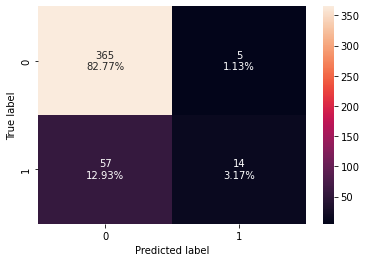

In [121]:
confusion_matrix_sklearn(logreg, X_test, y_test)

**Confusion Matrix -**

* Employee left and the model predicted it correctly that is employee will attrite :  True Positive (observed=1,predicted=1)

* Employee didn't leave and the model predicted employee will attrite : False Positive (observed=0,predicted=1)

* Employee didn't leave and the model predicted employee will not attrite : True Negative (observed=0,predicted=0)

* Employee left and the model predicted that employee won't : False Negative (observed=1,predicted=0)

In [122]:
logreg_model_train_perf=model_performance_classification_sklearn(logreg, X_train, y_train)
print("Training performance \n",logreg_model_train_perf)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.859086  0.162651   0.818182  0.271357


In [123]:
logreg_model_test_perf=model_performance_classification_sklearn(logreg, X_test, y_test)
print("Testing performance \n",logreg_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision        F1
0   0.85941  0.197183   0.736842  0.311111


* Logistic regression model has an accuracy of approximately 85.98% on the training set and 85.94% on the test set. This is generally good and indicates that the model is able to correctly predict a high percentage of the instances. However, The low F1 score in conjunction with the low recall suggests the model might be biased towards predicting the majority class, especially if the dataset is imbalanced.

## Build Decision Tree Model

* We will build our model using the DecisionTreeClassifier function. Using default 'gini' criteria to split. 
* If the frequency of class A is 10% and the frequency of class B is 90%, then class B will become the dominant class and the decision tree will become biased toward the dominant classes.

* In this case, we can pass a dictionary {0:0.17,1:0.83} to the model to specify the weight of each class and the decision tree will give more weightage to class 1.

* class_weight is a hyperparameter for the decision tree classifier.

In [92]:
dtree = DecisionTreeClassifier(criterion='gini',class_weight={0:0.17,1:0.83},random_state=1)

In [93]:
dtree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, random_state=1)

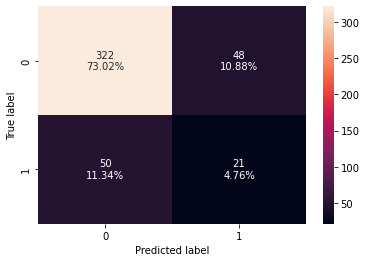

In [94]:
confusion_matrix_sklearn(dtree, X_test, y_test)

In [95]:
dtree_model_train_perf=model_performance_classification_sklearn(dtree, X_train, y_train)
print("Training performance \n",dtree_model_train_perf)

Training performance 
    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0


In [96]:
dtree_model_test_perf=model_performance_classification_sklearn(dtree, X_test, y_test)
print("Testing performance \n",dtree_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision   F1
0  0.777778  0.295775   0.304348  0.3


* Decision tree is working well on the training data but is not able to generalize well on the test data concerning the recall.

### Bagging Classifier

In [97]:
bagging = BaggingClassifier(random_state=1)
bagging.fit(X_train,y_train)

BaggingClassifier(random_state=1)

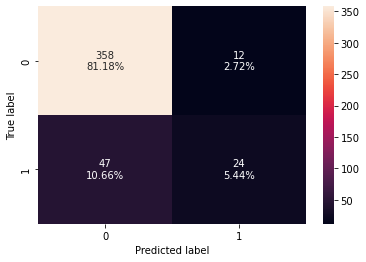

In [98]:
confusion_matrix_sklearn(bagging, X_test, y_test)

In [99]:
bagging_model_train_perf=model_performance_classification_sklearn(bagging, X_train, y_train)
print("Training performance \n",bagging_model_train_perf)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.985423  0.921687   0.987097  0.953271


In [100]:
bagging_model_test_perf=model_performance_classification_sklearn(bagging, X_test, y_test)
print("Testing performance \n",bagging_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision        F1
0  0.866213  0.338028   0.666667  0.448598


* Bagging classifier is overfitting on the training set and is performing poorly on the test set in terms of recall.

### Random Forest

In [101]:
rf = RandomForestClassifier(random_state=1)
rf.fit(X_train,y_train)

RandomForestClassifier(random_state=1)

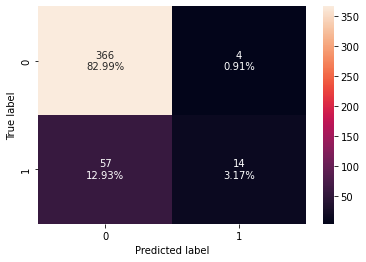

In [102]:
confusion_matrix_sklearn(rf,X_test,y_test)

In [103]:
rf_model_train_perf=model_performance_classification_sklearn(rf,X_train,y_train)
print("Training performance \n",rf_model_train_perf)

Training performance 
    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0


In [104]:
rf_model_test_perf=model_performance_classification_sklearn(rf,X_test,y_test)
print("Testing performance \n",rf_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision        F1
0  0.861678  0.197183   0.777778  0.314607


* Random Forest has performed well in terms of accuracy and precision, but it is not able to generalize well on the test data in terms of recall.

### XGBoost Classifier

In [131]:
from xgboost import XGBClassifier

# Fitting the model
xgb= XGBClassifier(random_state=1, eval_metric="logloss")
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=1, ...)

Training performance:
    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0
Testing performance:
    Accuracy    Recall  Precision        F1
0  0.866213  0.352113   0.657895  0.458716


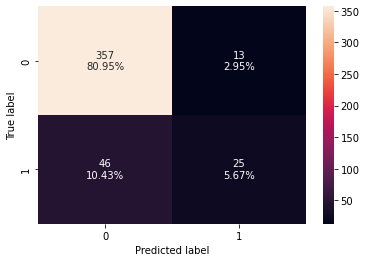

In [132]:
# Calculating different metrics
xgb_model_train_perf = model_performance_classification_sklearn(
    xgb, X_train, y_train
)
print("Training performance:\n", xgb_model_train_perf)
xgb_model_test_perf = model_performance_classification_sklearn(
    xgb, X_test, y_test
)
print("Testing performance:\n", xgb_model_test_perf)

# Creating confusion matrix
confusion_matrix_sklearn(xgb, X_test, y_test)

- The XGBoost classifier is overfitting the training data.

### Tuning Models

### Using GridSearch for Hyperparameter tuning model

* Hyperparameter tuning is also tricky in the sense that there is no direct way to calculate how a change in the
  hyperparameter value will reduce the loss of your model, so we usually resort to experimentation. i.e we'll use Grid search
* Grid search is a tuning technique that attempts to compute the optimum values of hyperparameters. 
* It is an exhaustive search that is performed on a the specific parameter values of a model.
* The parameters of the estimator/model used to apply these methods are optimized by cross-validated grid-search over a parameter grid.

**Tuning Logistic Regression**

In [124]:
# Choose the type of classifier. 
logreg_estimator = LogisticRegression(random_state=1)

# Grid of parameters to choose from
parameters = {'C': np.logspace(-4, 4, 20),  # Values for C (regularization)
              'penalty': ['l1', 'l2'],  # Types of regularization
              'solver': ['liblinear', 'saga']  # Solvers that support both l1 and l2 penalties
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(logreg_estimator, parameters, scoring=scorer, cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
logreg_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
logreg_estimator.fit(X_train, y_train)

LogisticRegression(C=11.288378916846883, penalty='l1', random_state=1,
                   solver='liblinear')

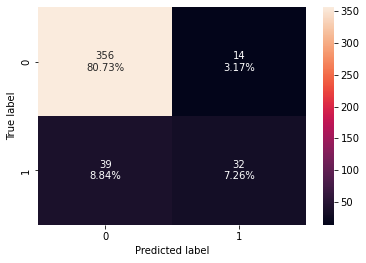

In [125]:
confusion_matrix_sklearn(logreg_estimator, X_test, y_test)

In [126]:
logreg_estimator_model_train_perf=model_performance_classification_sklearn(logreg_estimator, X_train, y_train)
print("Training performance \n",logreg_estimator_model_train_perf)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.884354  0.439759   0.737374  0.550943


In [127]:
logreg_estimator_model_test_perf=model_performance_classification_sklearn(logreg_estimator, X_test, y_test)
print("Testing performance \n",logreg_estimator_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision        F1
0  0.879819  0.450704   0.695652  0.547009


* Recall, Accuracy and F1 score have improved but the precision of the model has dropped drastically. It indicates that while your model is now identifying more true positives, it is also making more false positive errors. In other words, the model is becoming less "precise" in its predictions.

**Tuning Decision Tree**

In [105]:
# Choose the type of classifier. 
dtree_estimator = DecisionTreeClassifier(class_weight={0:0.17,1:0.83},random_state=1)

# Grid of parameters to choose from
parameters = {'max_depth': np.arange(2,30), 
              'min_samples_leaf': [1, 2, 5, 7, 10],
              'max_leaf_nodes' : [2, 3, 5, 10,15],
              'min_impurity_decrease': [0.0001,0.001,0.01,0.1]
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(dtree_estimator, parameters, scoring=scorer)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
dtree_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
dtree_estimator.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, max_depth=7,
                       max_leaf_nodes=15, min_impurity_decrease=0.0001,
                       min_samples_leaf=7, random_state=1)

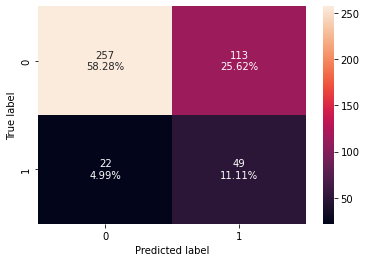

In [106]:
confusion_matrix_sklearn(dtree_estimator, X_test,y_test)

In [107]:
dtree_estimator_model_train_perf=model_performance_classification_sklearn(dtree_estimator, X_train,y_train)
print("Training performance \n",dtree_estimator_model_train_perf)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.767736  0.795181   0.391691  0.524851


In [108]:
dtree_estimator_model_test_perf=model_performance_classification_sklearn(dtree_estimator, X_test, y_test)
print("Testing performance \n",dtree_estimator_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision        F1
0  0.693878  0.690141   0.302469  0.420601


* Overfitting in decision tree has reduced but the recall has also reduced.

**Tuning Bagging Classifier**

In [109]:
# grid search for bagging classifier
cl1 = DecisionTreeClassifier(class_weight={0:0.13,1:0.87},random_state=1)
param_grid = {'base_estimator':[cl1],
              'n_estimators':[5,7,15,51,101],
              'max_features': [0.7,0.8,0.9,1]
             }

grid = GridSearchCV(BaggingClassifier(random_state=1,bootstrap=True), param_grid=param_grid, scoring = 'recall', cv = 5)
grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=BaggingClassifier(random_state=1),
             param_grid={'base_estimator': [DecisionTreeClassifier(class_weight={0: 0.13,
                                                                                 1: 0.87},
                                                                   random_state=1)],
                         'max_features': [0.7, 0.8, 0.9, 1],
                         'n_estimators': [5, 7, 15, 51, 101]},
             scoring='recall')

In [110]:
## getting the best estimator
bagging_estimator  = grid.best_estimator_
bagging_estimator.fit(X_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0: 0.13,
                                                                      1: 0.87},
                                                        random_state=1),
                  max_features=1, n_estimators=15, random_state=1)

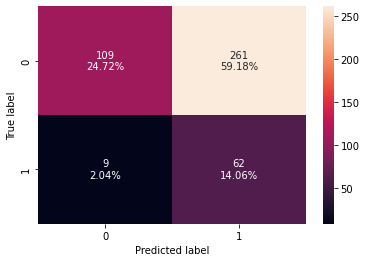

In [111]:
confusion_matrix_sklearn(bagging_estimator, X_test,y_test)

In [112]:
bagging_estimator_model_train_perf=model_performance_classification_sklearn(bagging_estimator, X_train,y_train)
print("Training performance \n",bagging_estimator_model_train_perf)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.394558  0.933735   0.202086  0.332262


In [113]:
bagging_estimator_model_test_perf=model_performance_classification_sklearn(bagging_estimator, X_test, y_test)
print("Testing performance \n",bagging_estimator_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision        F1
0  0.387755  0.873239    0.19195  0.314721


* Recall has improved but the accuracy and precision of the model has dropped drastically which is an indication that overall the model is making many mistakes.

**Tuning Random Forest**

In [114]:
# Choose the type of classifier. 
rf_estimator = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {  
        "n_estimators": [110,251,501],
        "min_samples_leaf": np.arange(1, 6,1),
        "max_features": [0.7,0.9,'log2','auto'],
        "max_samples": [0.7,0.9,None],
}

# Run the grid search
grid_obj = GridSearchCV(rf_estimator, parameters, scoring='recall',cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
rf_estimator.fit(X_train, y_train)

RandomForestClassifier(max_features=0.7, max_samples=0.7, min_samples_leaf=2,
                       n_estimators=110, random_state=1)

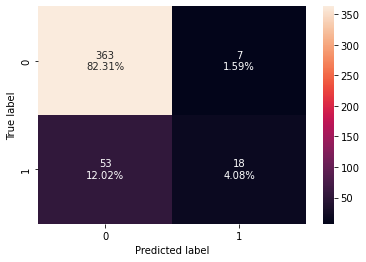

In [115]:
confusion_matrix_sklearn(rf_estimator, X_test,y_test)

In [116]:
rf_estimator_model_train_perf=model_performance_classification_sklearn(rf_estimator, X_train,y_train)
print("Training performance \n",rf_estimator_model_train_perf)

Training performance 
    Accuracy    Recall  Precision        F1
0  0.965986  0.789157        1.0  0.882155


In [117]:
rf_estimator_model_test_perf=model_performance_classification_sklearn(rf_estimator, X_test, y_test)
print("Testing performance \n",rf_estimator_model_test_perf)

Testing performance 
    Accuracy    Recall  Precision     F1
0  0.863946  0.253521       0.72  0.375


* Random forest after tuning has given poor performance compared to un-tuned random forest.

**Tuning XGBoost**

In [135]:
# Choose the type of classifier.
xgb_estimator = XGBClassifier(random_state=1, eval_metric="logloss")

# Grid of parameters to choose from
parameters = {
    "n_estimators": np.arange(150, 250, 50),
    "scale_pos_weight": [1, 2],
    "subsample": [0.9, 1],
    "learning_rate": np.arange(0.1, 0.21, 0.1),
    "gamma": [3, 5],
    "colsample_bytree": [0.8, 0.9],
    "colsample_bylevel": [0.9, 1],
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_estimator, parameters, scoring=scorer, cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
xgb_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_estimator.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.9,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, gamma=5, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.2, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=200, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=1, ...)

Training performance:
    Accuracy    Recall  Precision    F1
0  0.987366  0.939759   0.981132  0.96
Testing performance:
    Accuracy    Recall  Precision        F1
0  0.873016  0.478873   0.641509  0.548387


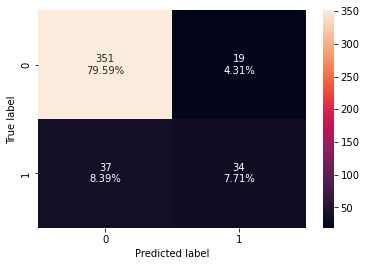

In [136]:
# Calculating different metrics
xgb_estimator_model_train_perf = model_performance_classification_sklearn(
    xgb_estimator, X_train, y_train
)
print("Training performance:\n", xgb_estimator_model_train_perf)
xgb_estimator_model_test_perf = model_performance_classification_sklearn(
    xgb_estimator, X_test, y_test
)
print("Testing performance:\n", xgb_estimator_model_test_perf)

# Creating confusion matrix
confusion_matrix_sklearn(xgb_estimator, X_test, y_test)

- The tuned model has slightly less accuracy, precision, recall, and F1 on the training set, which likely means it has reduced overfitting.
- After tuning the XGBoost model, we achieved a better balance between recall and precision, with a significant improvement in recall at the cost of a minor reduction in precision.

### Comparing all the models

In [157]:
from sklearn.metrics import roc_curve

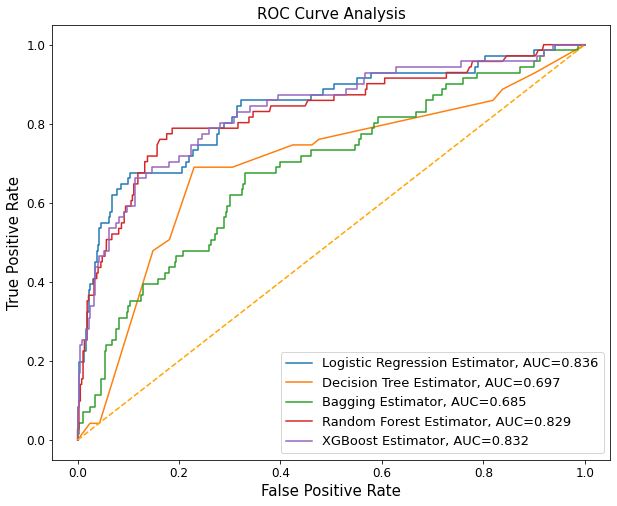

In [144]:
# Here's a list of your trained models. Replace the None with your actual model variables.
models = {
    "Logistic Regression Estimator": logreg_estimator,
    "Decision Tree Estimator": dtree_estimator,
    "Bagging Estimator": bagging_estimator,
    "Random Forest Estimator": rf_estimator,
    "XGBoost Estimator": xgb_estimator
}

result_table = pd.DataFrame(columns=['classifiers', 'fpr', 'tpr', 'auc'])

# Calculate ROC curve and AUC for each model
for model_name, model in models.items():
    # Ensure the model has the predict_proba method
    if hasattr(model, "predict_proba"):
        yproba = model.predict_proba(X_test)[:,1]
        fpr, tpr, _ = roc_curve(y_test, yproba)
        auc = roc_auc_score(y_test, yproba)
        result_table = result_table.append({
            'classifiers': model_name,
            'fpr': fpr, 
            'tpr': tpr, 
            'auc': auc
        }, ignore_index=True)

# Set the index to the classifier names
result_table.set_index('classifiers', inplace=True)

plt.figure(figsize=(10,8))

for classifier in result_table.index:
    plt.plot(result_table.loc[classifier]['fpr'], 
             result_table.loc[classifier]['tpr'], 
             label="{}, AUC={:.3f}".format(classifier, result_table.loc[classifier]['auc']))

plt.plot([0, 1], [0, 1], color='orange', linestyle='--')

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('False Positive Rate', fontsize=15)
plt.ylabel('True Positive Rate', fontsize=15)
plt.title('ROC Curve Analysis', fontsize=15)
plt.legend(loc='lower right', fontsize=13)
plt.show()

- Given these AUC scores, the **Logistic Regression Estimator** is showing the highest AUC and, therefore, could be considered the best-performing model among those listed when it comes to distinguishing between the classes. 
- However, it's important to note that while AUC is a valuable metric, the choice of the "best" model may also depend on the specific context of the problem, including the cost of false positives versus false negatives. We may opt for a model with a slightly lower AUC but better precision at the relevant threshold.

In [137]:
# training performance comparison

models_train_comp_df = pd.concat(
    [logreg_model_train_perf.T,dtree_model_train_perf.T,bagging_model_train_perf.T,rf_model_train_perf.T, xgb_model_train_perf.T,
    logreg_estimator_model_train_perf.T, dtree_estimator_model_train_perf.T, bagging_estimator_model_train_perf.T,
     rf_estimator_model_train_perf.T, xgb_estimator_model_train_perf.T],
    axis=1,
)
models_train_comp_df.columns = [
    "Logistic Regression",
    "Decision Tree",
    "Bagging Classifier",
    "Random Forest Classifier",
    "XGBoost Classifier",
    "Logistic Regression Estimator",
    "Decision Tree Estimator",
    "Bagging Estimator",
    "Random Forest Estimator",
    "XGBoost Estimator"]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Logistic Regression,Decision Tree,Bagging Classifier,Random Forest Classifier,XGBoost Classifier,Logistic Regression Estimator,Decision Tree Estimator,Bagging Estimator,Random Forest Estimator,XGBoost Estimator
Accuracy,0.859086,1.0,0.985423,1.0,1.0,0.884354,0.767736,0.394558,0.965986,0.987366
Recall,0.162651,1.0,0.921687,1.0,1.0,0.439759,0.795181,0.933735,0.789157,0.939759
Precision,0.818182,1.0,0.987097,1.0,1.0,0.737374,0.391691,0.202086,1.000000,0.981132
F1,0.271357,1.0,0.953271,1.0,1.0,0.550943,0.524851,0.332262,0.882155,0.960000


In [138]:
# training performance comparison

models_test_comp_df = pd.concat(
    [logreg_model_test_perf.T, dtree_model_test_perf.T,bagging_model_test_perf.T,rf_model_test_perf.T, xgb_model_test_perf.T,
    logreg_estimator_model_test_perf.T, dtree_estimator_model_test_perf.T, bagging_estimator_model_test_perf.T,
     rf_estimator_model_test_perf.T, xgb_estimator_model_test_perf.T],
    axis=1,
)
models_test_comp_df.columns = [
    "Logistic Regression",
    "Decision Tree",
    "Bagging Classifier",
    "Random Forest Classifier",
    "XGBoost Classifier",
    "Logistic Regression Estimator",
    "Decision Tree Estimator",
    "Bagging Estimator",
    "Random Forest Estimator",
    "XGBoost Estimator"]
print("Testing performance comparison:")
models_test_comp_df

Testing performance comparison:


,Logistic Regression,Decision Tree,Bagging Classifier,Random Forest Classifier,XGBoost Classifier,Logistic Regression Estimator,Decision Tree Estimator,Bagging Estimator,Random Forest Estimator,XGBoost Estimator
Accuracy,0.859410,0.777778,0.866213,0.861678,0.866213,0.879819,0.693878,0.387755,0.863946,0.873016
Recall,0.197183,0.295775,0.338028,0.197183,0.352113,0.450704,0.690141,0.873239,0.253521,0.478873
Precision,0.736842,0.304348,0.666667,0.777778,0.657895,0.695652,0.302469,0.191950,0.720000,0.641509
F1,0.311111,0.300000,0.448598,0.314607,0.458716,0.547009,0.420601,0.314721,0.375000,0.548387


* Decision tree performed well on training and test set.
* Bagging classifier overfitted the data before and after tuning.
* Random Forest with default parameters performed same as after tuning - As the final results depend on the parameters used/checked using GridSearchCV, There may be yet better parameters which may result in a better performance.
* 0.199 precision is a cost for raising the recall 
* it depends on the cost benefit analysis, eventhough the precision os bagging is low, but they get higher recall, which is good model.
* Random forest is black box model where we cant see or calculate behind the model like decision tree or bagging.

**Training Performance:**
- XGBoost Estimator (tuned) shows the best balance between all metrics, indicating a strong fit without perfect scores, which often suggest overfitting. It has a high F1 score which balances recall and precision.
- Models with perfect scores of 1.0 in training (Decision Tree, Bagging Classifier, Random Forest, and XGBoost Classifier before tuning) are likely overfitting, as they have 100% accuracy and recall. While they performed perfectly on the training data, they may not generalize well to new, unseen data.

**Testing Performance:**
- XGBoost Estimator (tuned) again has the highest recall, F1 score, and the second-highest precision. The balance between recall and precision is important, as it indicates the model's ability to correctly identify positive cases (recall) while maintaining a high ratio of true positive predictions (precision). Its F1 score is also the highest, indicating a good balance between precision and recall.
- Random Forest Estimator (tuned) also performs well in terms of accuracy and precision, but its recall is significantly lower than the XGBoost Estimator. This suggests it is conservative in predicting positive cases, resulting in fewer false positives but more false negatives.
- Logistic Regression Estimator (tuned) shows a good balance with moderate scores across the board and high precision, indicating fewer false positive predictions. However, its recall is lower than the XGBoost Estimator.

**Best Performance:**
- The top 3 models are: XGBoost Estimator, Logistic Regression Estimator and Random Forest Estimator
- The tuned XGBoost Estimator seems to be the best performing model on this dataset, both on training and testing data. Its high recall and F1 score are particularly compelling if the positive class is of significant interest or if it is more costly to miss positive cases (false negatives) than to deal with false positives.

### Important features of the final model

In [154]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(rf_estimator.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                                        Imp
MonthlyIncome                      0.088626
OverTime_Yes                       0.058493
Age                                0.057757
DistanceFromHome                   0.057653
YearsAtCompany                     0.052920
DailyRate                          0.052773
MonthlyRate                        0.046629
HourlyRate                         0.043720
TotalWorkingYears                  0.042661
JobSatisfaction                    0.040161
StockOptionLevel                   0.039106
EnvironmentSatisfaction            0.035370
NumCompaniesWorked                 0.034716
PercentSalaryHike                  0.031316
JobInvolvement                     0.028659
RelationshipSatisfaction           0.026340
TrainingTimesLastYear              0.025999
YearsWithCurrManager               0.023800
WorkLifeBalance                    0.022320
Education                          0.017641
YearsSinceLastPromotion            0.016902
MaritalStatus_Single            

In [146]:
feature_names = X_train.columns

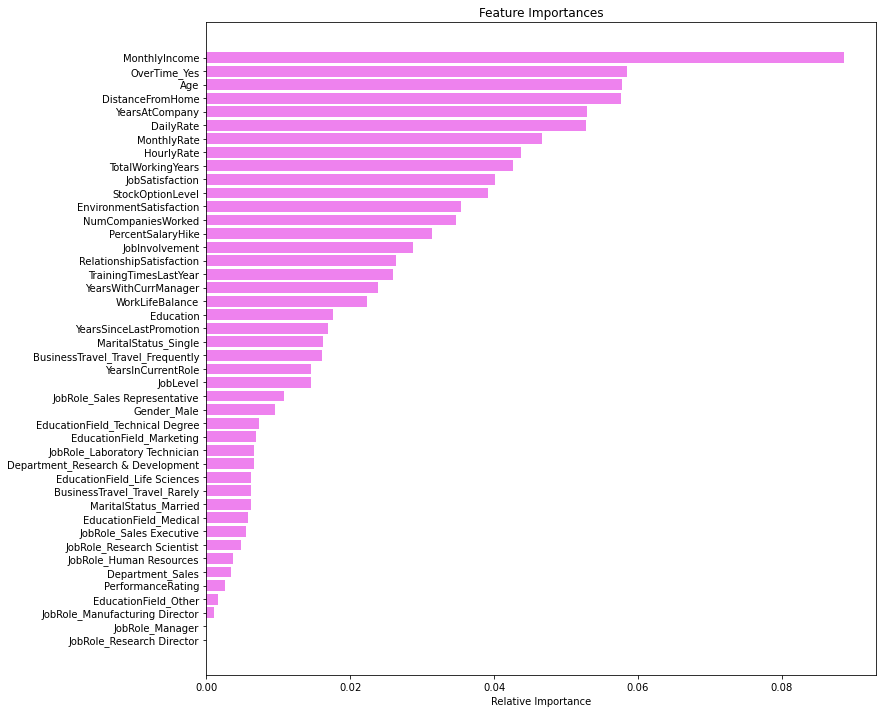

In [159]:
importances = rf_estimator.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

* Monthly income is the most important feature for prediction followed by Overtime, Age, Distance from Home and Years at Company

## Business Insights and Recommendations

* We have been able to build a predictive model:
  a) that company can deploy this model to identify employees who are at the risk of attrition.
  b) that company can use to find the drivers of attrition. 
  c) based on which company can take appropriate actions to build better retention policies. 

* Factors that drive attrition - Monthly Income, Overtime, and Age.
* Monthly Income: Employees with lower income attrite more, which is also logical as they might get offers with higher pay in different organizations - the company should make sure that all employees are compensated based on industry standards.

* Overtime: Those employees who have to work overtime are the ones who attrite more - the company can provide some additional incentives to such employees to retain them.

* Age: Younger employees are the ones that attrite more- the company can make sure the new joiners have a friendly environment and better opportunities for excelling in their career.

* Distance From home is also an important factor for attrition - employees traveling more distance to reach the workplace are the ones attriting. For such employees, the company can provide cab facilities so that the commute of employees gets easier. 

* As work-related travel frequency increases, Attrition rate also increases - the company should 

* Training doesn't seem to have an impact on attrition- the company needs to investigate more here, if training does not impact employee retention then better cost planning can be done.

* Employee with more experience and the employees working for most years in the company is the loyal one's and generally do not attrite.

* Highest attrition is in the Sales department more research should go into this to check what is wrong in the sales department?

* Our data collection technique is working well as the ratings given by employees in -Environment Satisfaction, Job Satisfaction, Relationship Satisfaction, and Work-Life Balance shows a difference significant difference between attriting and non-attriting employees. These scales can act as a preliminary step to understand the dissatisfaction of employees - Lower the rating higher are the chances of attrition.